# Project: Amazon product recommender & Purchase prediction

Data source: https://nijianmo.github.io/amazon/index.html
<br><br><b>Data description:</b>
<br>This dataset consists of reviews from amazon. The full data set span a period of 22 years, including ~233.1 million reviews up to Oct 2018. Reviews include product and user information, ratings, and a plaintext review. In this project, I'll work with a subet of the full data which fous on Books category and has been reduced to extract the 5-core which include users and items have at least 5 reviews (27,164,983 reviews of Books category) :
<li>reviewerID - ID of the reviewer, e.g. A2SUAM1J3GNN3B
<li>asin - ID of the product, e.g. 0000013714
<li>reviewerName - name of the reviewer
<li>vote - helpful votes of the review
<li>style - a disctionary of the product metadata, e.g., "Format" is "Hardcover"
<li>reviewText - text of the review
<li>overall - rating of the product
<li>summary - summary of the review
<li>unixReviewTime - time of the review (unix time)
<li>reviewTime - time of the review (raw)
<li>image - images that users post after they have received the product
<br>
<br>Metadata: Metadata includes descriptions, price, sales-rank, brand info, and co-purchasing links

Citation:
<br>Justifying recommendations using distantly-labeled reviews and fined-grained aspects
<br>Jianmo Ni, Jiacheng Li, Julian McAuley
<br>Empirical Methods in Natural Language Processing (EMNLP), 2019

## Types of Recommendation:
<li><b>Collaborative filtering</b> is based on the assumption that people who agreed in the past will agree in the future, and that they will like similar kinds of items as they liked in the past. For example, if a person A likes item 1, 2, 3 and B like 2,3,4 then they have similar interests and A should like item 4 and B should like item 1.
<ol><li>User-user collaborative filtering
<li>Item-Item collaborative filtering</ol>
<li><b>Content-based filtering:</b> The idea of content-based filtering is that if you like an item you will also like a ‘similar’ item.
<li><b>Hybrid Recommendation systems</b>
<br><br>Ref: https://towardsdatascience.com/what-are-product-recommendation-engines-and-the-various-versions-of-them-9dcab4ee26d5

## Model strategy:
### Hybrid model is the combination of user-based collaborative filtering and content-based filtering
<li> User-based collaborative: compare and suggest between users share similar interests ('user_id')
<li> Content-based filtering: based on 'meta' data to suggest similar products to user.


In [1]:
import pandas as pd
import gzip
import json
import polars as pl
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go

### Import data

In [2]:
def parse(path):
  g = gzip.open(path, 'rb')
  for l in g:
    yield json.loads(l)

def getDF(path):
  i = 0
  df = {}
  for d in parse(path):
    df[i] = d
    i += 1
  return pd.DataFrame.from_dict(df, orient='index')

In [28]:
meta=getDF('/Users/kienguyen/Documents/DATA SCIENCE/MSDS/12. Practicum II/data set/meta_Movies_and_TV.jsonl.gz')

In [29]:
# review data:
review = getDF('/Users/kienguyen/Documents/DATA SCIENCE/MSDS/12. Practicum II/data set/Movies_and_TV.jsonl.gz')

In [30]:
review['verified_purchase'].value_counts()

True     13757796
False     3570518
Name: verified_purchase, dtype: int64

In [31]:
# Keep verified purchases only:
review=review[review['verified_purchase']==True]

In [32]:
meta.columns

Index(['main_category', 'title', 'subtitle', 'average_rating', 'rating_number',
       'features', 'description', 'price', 'images', 'videos', 'store',
       'categories', 'details', 'parent_asin', 'bought_together', 'author'],
      dtype='object')

In [33]:
review.columns

Index(['rating', 'title', 'text', 'images', 'asin', 'parent_asin', 'user_id',
       'timestamp', 'helpful_vote', 'verified_purchase'],
      dtype='object')

In [34]:
#drop not necessary columns:
review.drop(['images','timestamp','asin','helpful_vote','verified_purchase'],axis=1,inplace=True)
meta.drop(['subtitle','images','videos','store','bought_together','author'],axis=1,inplace=True)

### Clean the data

#### Drop missing values

<Axes: >

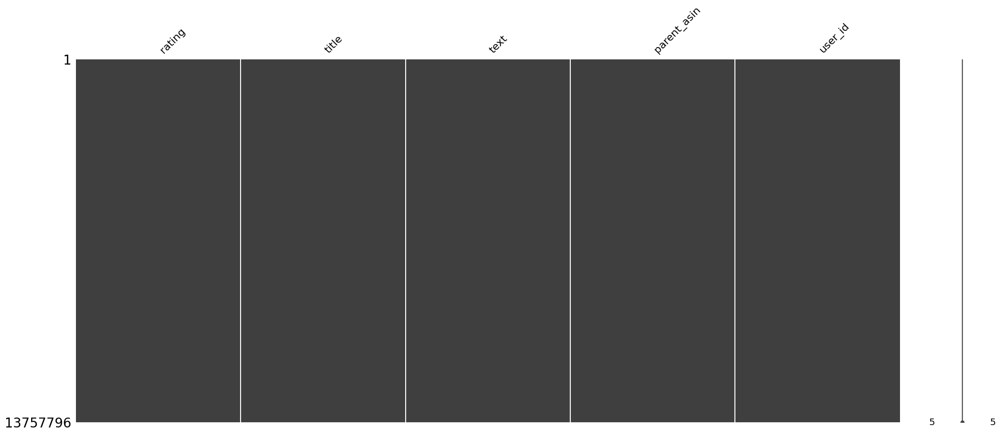

In [35]:
import missingno as msno
msno.matrix(review)

<Axes: >

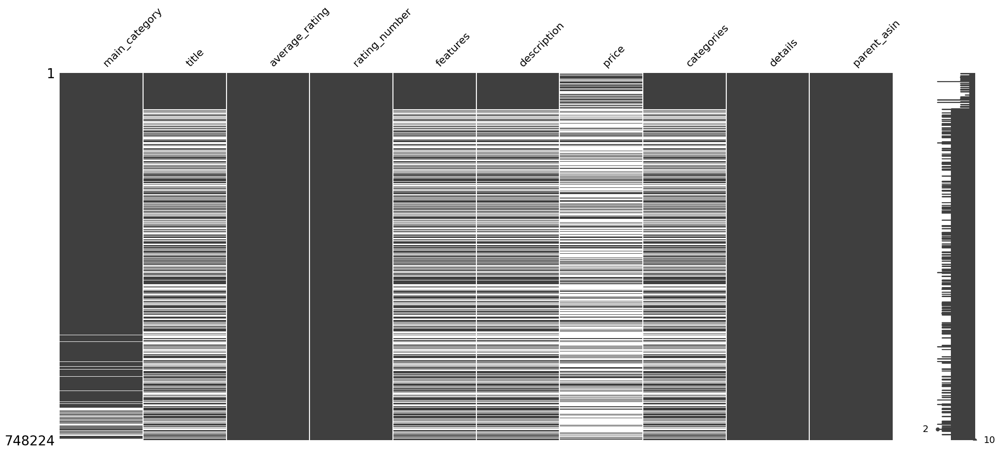

In [36]:
msno.matrix(meta)

In [37]:
meta.isnull().sum()

main_category      36338
title             313988
average_rating       246
rating_number        246
features          313988
description       313988
price             484269
categories        313988
details               12
parent_asin            0
dtype: int64

In [38]:
review.isnull().sum()

rating         0
title          0
text           0
parent_asin    0
user_id        0
dtype: int64

#### Missing data strategy: the missing lvalues will be dropped

In [ ]:
# looking at the missing values and then check again on amazon.com by 'parent_asin':
meta.loc[meta['price'].isnull()]

,main_category,title,average_rating,rating_number,features,description,price,categories,details,parent_asin
1,Prime Video,One Perfect Wedding,3.0,6.0,"[IMDb 6.1, 1 h 27 min, 2021, ALL]",[With her book tour in two weeks and his expan...,None,"[Comedy, Drama, Romance]","{'Audio languages': ['English'], 'Subtitles': ...",B09WDLJ4HP
5,Movies & TV,Sacred Flesh,3.7,63.0,[],"[Product Description, Torn between sexual desi...",None,"[Movies & TV, Genre for Featured Categories, H...","{'Format': 'Color, AC-3, Closed-captioned, Col...",B0001YJBJ6
6,Prime Video,Let Sleeping Corpses Lie,4.2,96.0,"[IMDb 6.8, 1 h 32 min, 1975, R]",[A cop chases two hippies suspected of a serie...,None,"[Horror, Atmospheric, Intense]","{'Subtitles': ['None available'], 'Directors':...",B018RDV40G
11,Movies & TV,Pink Cadillac [DVD],4.6,972.0,[],[A comic action-adventure about a modern-day b...,None,"[Movies & TV, Studio Specials, Warner Home Vid...","{'Genre': 'Action & Adventure', 'Format': 'Ana...",B00009N83U
15,Movies & TV,Teddy,5.0,1.0,[],[From creators Steve Goltz and Kevin Sommerfie...,None,"[Movies & TV, Disc on Demand]","{'Format': 'NTSC', 'Contributor': 'Steve Goltz...",B0052ZO9TQ
...,...,...,...,...,...,...,...,...,...,...
748217,Prime Video,None,1.5,2.0,None,None,None,None,"{'Subtitles': ['None available'], 'Directors':...",B01JB8JSJ0
748219,Prime Video,None,4.5,28.0,None,None,None,None,"{'Content advisory': ['Violence', 'alcohol use...",B075DJ3B57
748220,Prime Video,None,4.8,211.0,None,None,None,None,"{'Audio languages': ['English'], 'Subtitles': ...",B00BFDLKFK
748221,Prime Video,None,4.1,31.0,None,None,None,None,"{'Audio languages': ['English'], 'Subtitles': ...",B00BRZNXPG


In [39]:
# drop missing values:
meta.dropna(subset=['main_category'],inplace=True)
meta.dropna(subset=['title'],inplace=True)

<Axes: >

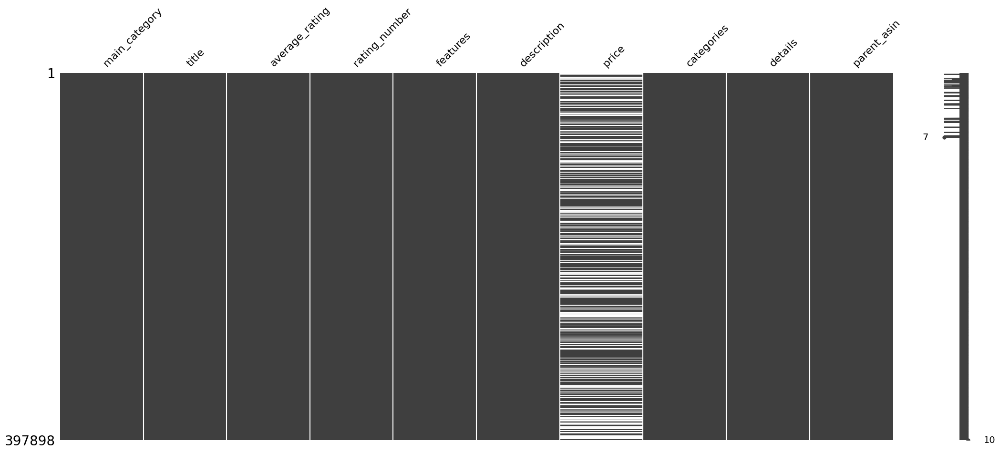

In [40]:
msno.matrix(meta)

In [41]:
meta.dropna(subset=['average_rating','rating_number','price'],inplace=True)

In [42]:
meta.isnull().sum()

main_category     0
title             0
average_rating    0
rating_number     0
features          0
description       0
price             0
categories        0
details           0
parent_asin       0
dtype: int64

In [43]:
meta.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 248423 entries, 0 to 748205
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   main_category   248423 non-null  object 
 1   title           248423 non-null  object 
 2   average_rating  248423 non-null  float64
 3   rating_number   248423 non-null  float64
 4   features        248423 non-null  object 
 5   description     248423 non-null  object 
 6   price           248423 non-null  object 
 7   categories      248423 non-null  object 
 8   details         248423 non-null  object 
 9   parent_asin     248423 non-null  object 
dtypes: float64(2), object(8)
memory usage: 20.8+ MB


In [44]:
meta.head(5)

,main_category,title,average_rating,rating_number,features,description,price,categories,details,parent_asin
0,Prime Video,Glee,4.7,2004.0,"[IMDb 6.8, 2013, 22 episodes, X-Ray, TV-14]","[Entering its fourth season, this year the mem...",22.39,"[Comedy, Drama, Arts, Entertainment, and Cultu...","{'Content advisory': ['Violence', 'substance u...",B00ABWKL3I
2,Movies & TV,How to Make Animatronic Characters - Organic M...,5.0,7.0,[],"[Product Description, In PART TWO of this incr...",64.99,"[Movies & TV, Genre for Featured Categories, S...",{'Package Dimensions': '7.52 x 5.31 x 0.71 inc...,B00AHN851G
3,Prime Video,Ode to Joy: Beethoven's Symphony No. 9,4.3,35.0,"[1 h 26 min, 2015, ALL]",[This special Ode to Joy: Beethoven's Symphony...,5.99,[Documentary],"{'Audio languages': ['English'], 'Subtitles': ...",B01G9ILXXE
4,Prime Video,Ben 10: Alien Force (Classic),4.7,360.0,"[IMDb 7.3, 2008, 13 episodes, 7+]",[Itâ€™s hero time again for Ben as he saves th...,24.49,"[Science Fiction, Comedy, Animation, Drama]","{'Audio languages': ['English'], 'Subtitles': ...",B009SIYXDA
7,Movies & TV,Marty Wilde: Born to Rock 'n' Roll - The 50th ...,4.5,81.0,[],[NTSC/Region 0. Marty Wilde was one of the UK'...,24.76,"[Movies & TV, Movies]","{'Genre': 'Rock, Music Video & Concerts', 'For...",B000XXDF9M


In [45]:
review.head(5)

,rating,title,text,parent_asin,user_id
0,5.0,Five Stars,"Amazon, please buy the show! I'm hooked!",B013488XFS,AGGZ357AO26RQZVRLGU4D4N52DZQ
1,5.0,Five Stars,My Kiddos LOVE this show!!,B00CB6VTDS,AGKASBHYZPGTEPO6LWZPVJWB2BVA
2,3.0,Some decent moments...but...,Annabella Sciorra did her character justice wi...,B096Z8Z3R6,AG2L7H23R5LLKDKLBEF2Q3L2MVDA
4,5.0,What Love Is...,"...isn't always how you expect it to be, but w...",B001H1SVZC,AG2L7H23R5LLKDKLBEF2Q3L2MVDA
5,5.0,QUIRKY TURNS TO HEARTSTRINGS,As you learn about the very unique characters ...,B06WVW16WY,AG2L7H23R5LLKDKLBEF2Q3L2MVDA


### Clean 'review' table

In [46]:
# creat a copy of review original:
review_df = review.copy(deep=True)

In [47]:
# lowercase
review_df['clean_text'] = review_df.text.apply(lambda x: " ".join(x.lower() for x in x.split()))
#remove punctuation
review_df['clean_text'] = review_df.clean_text.str.replace('[^\w\s]','')
# remove digit
review_df['clean_text'] = review_df.clean_text.str.replace('\d+','')
# remove stopwords:
from nltk.corpus import stopwords, words
stop = stopwords.words('english')
review_df['clean_text']= review_df.clean_text.apply(lambda x: " ".join(w for w in x.split() if w not in stop))


/var/folders/r6/21sj3lgj1xzb_kvnzq69b41h0000gn/T/ipykernel_27700/3078222644.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  review_df['clean_text'] = review_df.clean_text.str.replace('[^\w\s]','')
/var/folders/r6/21sj3lgj1xzb_kvnzq69b41h0000gn/T/ipykernel_27700/3078222644.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  review_df['clean_text'] = review_df.clean_text.str.replace('\d+','')


In [48]:
review_df.head(5)

,rating,title,text,parent_asin,user_id,clean_text
0,5.0,Five Stars,"Amazon, please buy the show! I'm hooked!",B013488XFS,AGGZ357AO26RQZVRLGU4D4N52DZQ,amazon please buy show im hooked
1,5.0,Five Stars,My Kiddos LOVE this show!!,B00CB6VTDS,AGKASBHYZPGTEPO6LWZPVJWB2BVA,kiddos love show
2,3.0,Some decent moments...but...,Annabella Sciorra did her character justice wi...,B096Z8Z3R6,AG2L7H23R5LLKDKLBEF2Q3L2MVDA,annabella sciorra character justice portrayal ...
4,5.0,What Love Is...,"...isn't always how you expect it to be, but w...",B001H1SVZC,AG2L7H23R5LLKDKLBEF2Q3L2MVDA,isnt always expect know movie deep struggles w...
5,5.0,QUIRKY TURNS TO HEARTSTRINGS,As you learn about the very unique characters ...,B06WVW16WY,AG2L7H23R5LLKDKLBEF2Q3L2MVDA,learn unique characters values hold dear notic...


In [49]:
# Lemmatization
import nltk
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
#establish the lemmatizer
wordnet_lemmatizer = WordNetLemmatizer()
review_df['clean_text'] = review_df.clean_text.apply(lambda x: " ".join(wordnet_lemmatizer.lemmatize(w) for w in x.split()))

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/kienguyen/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [50]:
# Drop users have less than 20 reviews
user_review_cnt = review_df.groupby('user_id').size()
user_to_keep = user_review_cnt[user_review_cnt >= 20].index
review_df_filtered = review_df[review_df['user_id'].isin(user_to_keep)]

In [51]:
review_df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2133445 entries, 28 to 17278916
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   rating       float64
 1   title        object 
 2   text         object 
 3   parent_asin  object 
 4   user_id      object 
 5   clean_text   object 
dtypes: float64(1), object(5)
memory usage: 113.9+ MB


In [52]:
review_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13757796 entries, 0 to 17328310
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   rating       float64
 1   title        object 
 2   text         object 
 3   parent_asin  object 
 4   user_id      object 
 5   clean_text   object 
dtypes: float64(1), object(5)
memory usage: 734.7+ MB


### Clean 'meta' table

In [53]:
meta_df = meta.copy(deep=True)

In [54]:
# convert 'features','description', 'categories', columns in list to string format:
meta_df['features'] = meta_df['features'].apply(lambda x: ','.join(map(str, x)))
meta_df['description'] = meta_df['description'].apply(lambda x: ','.join(map(str, x)))
meta_df['categories'] = meta_df['categories'].apply(lambda x: ','.join(map(str, x)))

In [55]:
meta_df.head(5)

,main_category,title,average_rating,rating_number,features,description,price,categories,details,parent_asin
0,Prime Video,Glee,4.7,2004.0,"IMDb 6.8,2013,22 episodes,X-Ray,TV-14","Entering its fourth season, this year the memb...",22.39,"Comedy,Drama,Arts, Entertainment, and Culture,...","{'Content advisory': ['Violence', 'substance u...",B00ABWKL3I
2,Movies & TV,How to Make Animatronic Characters - Organic M...,5.0,7.0,,"Product Description,In PART TWO of this incred...",64.99,"Movies & TV,Genre for Featured Categories,Spec...",{'Package Dimensions': '7.52 x 5.31 x 0.71 inc...,B00AHN851G
3,Prime Video,Ode to Joy: Beethoven's Symphony No. 9,4.3,35.0,"1 h 26 min,2015,ALL",This special Ode to Joy: Beethoven's Symphony ...,5.99,Documentary,"{'Audio languages': ['English'], 'Subtitles': ...",B01G9ILXXE
4,Prime Video,Ben 10: Alien Force (Classic),4.7,360.0,"IMDb 7.3,2008,13 episodes,7+",Itâ€™s hero time again for Ben as he saves the...,24.49,"Science Fiction,Comedy,Animation,Drama","{'Audio languages': ['English'], 'Subtitles': ...",B009SIYXDA
7,Movies & TV,Marty Wilde: Born to Rock 'n' Roll - The 50th ...,4.5,81.0,,NTSC/Region 0. Marty Wilde was one of the UK's...,24.76,"Movies & TV,Movies","{'Genre': 'Rock, Music Video & Concerts', 'For...",B000XXDF9M


In [56]:
meta_df[meta_df['features'] == '']['parent_asin'].count()

225823

In [57]:
# remove 'feature' column since the empty value are too much
meta_df.drop(['features'],axis=1,inplace=True)
# drop 'details' column since the value seems unnecessary:
meta_df.drop(['details'],axis=1,inplace=True)

#### Encoding

In [ ]:
#sub_cat_list = meta_df['categories'].str.split(',').explode().unique().tolist()

In [ ]:
#print(sub_cat_list)

['Comedy', 'Drama', 'Arts', ' Entertainment', ' and Culture', 'Music Videos and Concerts', 'Movies & TV', 'Genre for Featured Categories', 'Special Interests', 'Documentary', 'Science Fiction', 'Animation', 'Movies', 'Music Videos & Concerts', 'Blu-ray', 'Special Interest', 'Boxed Sets', 'Fitness & Yoga', 'Feel-good', 'Fun', 'Biting', 'Campy', 'Nostalgic', 'Horror', 'LGBT', 'Romance', 'Cheerful', 'Gentle', 'Historical', 'Cerebral', 'Compelling', 'Exercise & Fitness', 'Classics', 'Silent Films', 'Western', 'Action & Adventure', 'PBS', 'All', 'Kids', 'Fantasy', 'Science Fiction & Fantasy', 'Robots & Androids', 'Action', 'Adventure', 'Ambitious', 'Intense', 'Independently Distributed', 'Suspense', 'Foreign Films', 'Sci-Fi & Fantasy', 'Emotional', 'Talk Show and Variety', 'Anxious', 'Sports', 'Charming', 'Passionate', 'Studio Specials', '20th Century Fox Home Entertainment', 'General', 'Movies & TV Halloween Store', 'Family Friendly', 'Musicals & Performing Arts', 'Classical', 'Warner Home

#### clean text variables

In [58]:
# lowercase
meta_df['clean_description'] = meta_df.description.apply(lambda x: " ".join(x.lower() for x in x.split()))
#removew punctuation
meta_df['clean_description'] = meta_df.clean_description.str.replace('[^\w\s]','')
# remove digit
meta_df['clean_description'] = meta_df.clean_description.str.replace('\d+','')
# remove stopwords:
from nltk.corpus import stopwords, words
stop = stopwords.words('english')
meta_df['clean_description']= meta_df.clean_description.apply(lambda x: " ".join(w for w in x.split() if w not in stop))
# Lemmatization
meta_df['clean_description'] = meta_df.clean_description.apply(lambda x: " ".join(wordnet_lemmatizer.lemmatize(w) for w in x.split()))

/var/folders/r6/21sj3lgj1xzb_kvnzq69b41h0000gn/T/ipykernel_27700/1412897731.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  meta_df['clean_description'] = meta_df.clean_description.str.replace('[^\w\s]','')
/var/folders/r6/21sj3lgj1xzb_kvnzq69b41h0000gn/T/ipykernel_27700/1412897731.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  meta_df['clean_description'] = meta_df.clean_description.str.replace('\d+','')


### Merge dataset

In [59]:
merged_df = pd.merge(review_df_filtered, meta_df, on='parent_asin', how='inner')

In [60]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1063223 entries, 0 to 1063222
Data columns (total 14 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   rating             1063223 non-null  float64
 1   title_x            1063223 non-null  object 
 2   text               1063223 non-null  object 
 3   parent_asin        1063223 non-null  object 
 4   user_id            1063223 non-null  object 
 5   clean_text         1063223 non-null  object 
 6   main_category      1063223 non-null  object 
 7   title_y            1063223 non-null  object 
 8   average_rating     1063223 non-null  float64
 9   rating_number      1063223 non-null  float64
 10  description        1063223 non-null  object 
 11  price              1063223 non-null  object 
 12  categories         1063223 non-null  object 
 13  clean_description  1063223 non-null  object 
dtypes: float64(3), object(11)
memory usage: 121.7+ MB


In [61]:
merged_df.head(5)

,rating,title_x,text,parent_asin,user_id,clean_text,main_category,title_y,average_rating,rating_number,description,price,categories,clean_description
0,3.0,battlespace,this item was canceled. . . .no comments,B000PIU2A0,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,item canceled comment,Movies & TV,Battlespace,3.5,49.0,"""Battlespace"" is a futuristic sci-fi adventure...",19.99,"Movies & TV,Science Fiction & Fantasy,Science ...",battlespace futuristic scifi adventure begin d...
1,4.0,Four Stars,Have to love the non-standard /non-traditional...,B000PIU2A0,AGCVM6J2S7N5YQNHNVNXQNEWQGOA,love nonstandard nontraditional movie,Movies & TV,Battlespace,3.5,49.0,"""Battlespace"" is a futuristic sci-fi adventure...",19.99,"Movies & TV,Science Fiction & Fantasy,Science ...",battlespace futuristic scifi adventure begin d...
2,3.0,Three Stars,goog,B000PIU2A0,AGTS54M26X3WOTH4IWLYLCWF54UQ,goog,Movies & TV,Battlespace,3.5,49.0,"""Battlespace"" is a futuristic sci-fi adventure...",19.99,"Movies & TV,Science Fiction & Fantasy,Science ...",battlespace futuristic scifi adventure begin d...
3,5.0,Five Stars,VERY GOOD MOVIE: WAS LIKED BY ALL WHO SEEN IT,B001QTXM5Y,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,good movie liked seen,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,"Product Description,Watchmen: Special Edition ...",12.4,"Movies & TV,Genre for Featured Categories,Acti...",product descriptionwatchmen special edition db...
4,5.0,Watchmen review,I was not familiar with the watchmen series of...,B001QTXM5Y,AENSS3WUCE2RGLXX5TYBFBXBRQEQ,familiar watchman series comic interested movi...,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,"Product Description,Watchmen: Special Edition ...",12.4,"Movies & TV,Genre for Featured Categories,Acti...",product descriptionwatchmen special edition db...


In [62]:
merged_df.rename(columns={'title_x':'review_title','title_y':'product_name'})

,rating,review_title,text,parent_asin,user_id,clean_text,main_category,product_name,average_rating,rating_number,description,price,categories,clean_description
0,3.0,battlespace,this item was canceled. . . .no comments,B000PIU2A0,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,item canceled comment,Movies & TV,Battlespace,3.5,49.0,"""Battlespace"" is a futuristic sci-fi adventure...",19.99,"Movies & TV,Science Fiction & Fantasy,Science ...",battlespace futuristic scifi adventure begin d...
1,4.0,Four Stars,Have to love the non-standard /non-traditional...,B000PIU2A0,AGCVM6J2S7N5YQNHNVNXQNEWQGOA,love nonstandard nontraditional movie,Movies & TV,Battlespace,3.5,49.0,"""Battlespace"" is a futuristic sci-fi adventure...",19.99,"Movies & TV,Science Fiction & Fantasy,Science ...",battlespace futuristic scifi adventure begin d...
2,3.0,Three Stars,goog,B000PIU2A0,AGTS54M26X3WOTH4IWLYLCWF54UQ,goog,Movies & TV,Battlespace,3.5,49.0,"""Battlespace"" is a futuristic sci-fi adventure...",19.99,"Movies & TV,Science Fiction & Fantasy,Science ...",battlespace futuristic scifi adventure begin d...
3,5.0,Five Stars,VERY GOOD MOVIE: WAS LIKED BY ALL WHO SEEN IT,B001QTXM5Y,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,good movie liked seen,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,"Product Description,Watchmen: Special Edition ...",12.4,"Movies & TV,Genre for Featured Categories,Acti...",product descriptionwatchmen special edition db...
4,5.0,Watchmen review,I was not familiar with the watchmen series of...,B001QTXM5Y,AENSS3WUCE2RGLXX5TYBFBXBRQEQ,familiar watchman series comic interested movi...,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,"Product Description,Watchmen: Special Edition ...",12.4,"Movies & TV,Genre for Featured Categories,Acti...",product descriptionwatchmen special edition db...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1063218,5.0,Great,"I enjoyed my DVD... I got it on time, and in a...",B001BZOFF4,AEDCQQOL6WHB4MZAYQU3XEOSGVNQ,enjoyed dvd got time fairly short time dvd gre...,Movies & TV,2007-2008 NBA Champions: Boston Celtics,4.6,155.0,Get an inside look at the NBA Champions regula...,6.49,"Movies & TV,Studio Specials,Warner Home Video,...",get inside look nba champion regular season tr...
1063219,5.0,Great,"I enjoyed my DVD... I got it on time, and in a...",B000CEV3HS,AEDCQQOL6WHB4MZAYQU3XEOSGVNQ,enjoyed dvd got time fairly short time dvd gre...,Sports & Outdoors,NBA Hardwood Classics: Below the Rim,4.7,9.0,NBA Hardwood Classics: Below the Rim,7.94,"Movies & TV,Studio Specials,Warner Home Video,...",nba hardwood classic rim
1063220,5.0,Great,"I enjoyed my DVD... I got it on time, and in a...",B000CEV3HS,AEDCQQOL6WHB4MZAYQU3XEOSGVNQ,enjoyed dvd got time fairly short time dvd gre...,Sports & Outdoors,NBA Hardwood Classics: Below the Rim,4.7,9.0,NBA Hardwood Classics: Below the Rim,7.94,"Movies & TV,Studio Specials,Warner Home Video,...",nba hardwood classic rim
1063221,5.0,It was great!,I had no issues with the product. It showed up...,B000B2YQBQ,AEDCQQOL6WHB4MZAYQU3XEOSGVNQ,issue product showed reasonable timeframe enjo...,Movies & TV,A Cut Above: 100 Seasons of Duke Basketball,4.1,37.0,"Ever since their 1906 formation, Duke Universi...",8.01,"Movies & TV,Independently Distributed,Documentary",ever since formation duke university blue devi...


### EDA

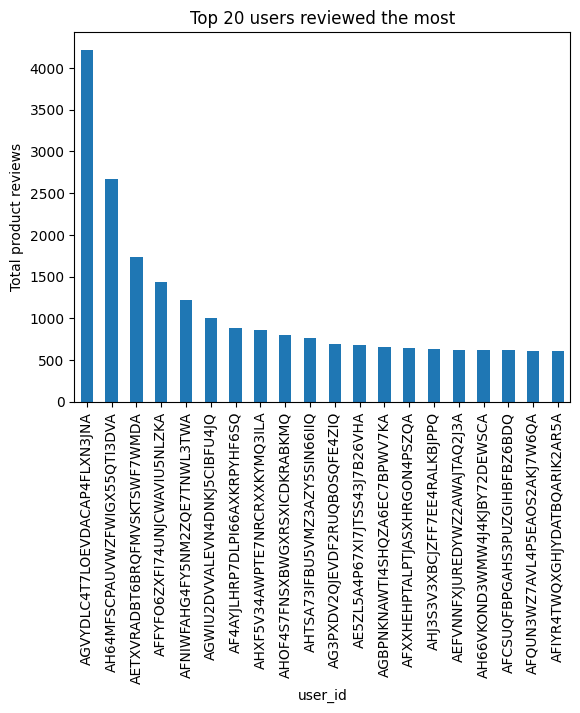

In [63]:
review_df_filtered.groupby(['user_id'])['parent_asin'].count().sort_values(ascending=False).head(20).plot(kind='bar')
plt.title('Top 20 users reviewed the most')
plt.ylabel('Total product reviews')
plt.show()

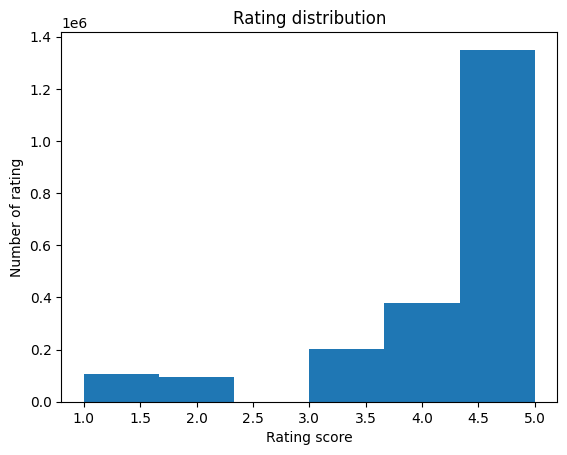

In [64]:
plt.hist(review_df_filtered['rating'],bins=6)
plt.title('Rating distribution')
plt.xlabel('Rating score')
plt.ylabel('Number of rating')
plt.show()

/var/folders/r6/21sj3lgj1xzb_kvnzq69b41h0000gn/T/ipykernel_27700/3703744810.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  review_df_filtered['clean_text'] = review_df_filtered.clean_text.apply(lambda x: " ".join(x for x in x.split() if len(x) > 2))


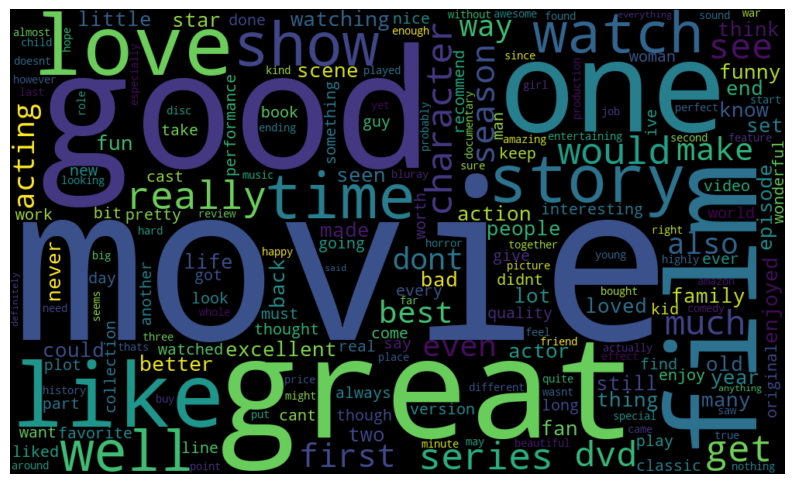

In [65]:
from wordcloud import WordCloud
# remove short word with less than 2 characters:
review_df_filtered['clean_text'] = review_df_filtered.clean_text.apply(lambda x: " ".join(x for x in x.split() if len(x) > 2))
# create list of words and their frequencies:
freq = pd.Series(' '.join(review_df_filtered.clean_text).split()).value_counts().to_dict()

# wordcloud:
wc = WordCloud(width=1000, height=600, max_words=200).generate_from_frequencies(freq)
plt.figure(figsize=(10, 10))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [66]:
# Distribution of 'average_rating', 'rating_number', 'price':
fig = make_subplots(rows=1,cols=3)
fig.add_trace(go.Histogram(x=meta_df.average_rating,name='Average rating'),row=1,col=1)
fig.add_trace(go.Box(y=meta_df.rating_number,name='Number of rating'),row=1,col=2)
fig.add_trace(go.Box(y=meta_df.price,name='Price'),row=1,col=3)
fig.update_layout(height=500,width=1000,title_text=f'Distribution: average_rating, rating_number, and price')
fig.show()

In [67]:
import plotly.express as px
cat=merged_df.groupby(['main_category'])['parent_asin'].count().sort_values(ascending= False)
cat_df=cat.to_frame()
cat_df=cat_df.reset_index()
fig = px.bar(cat_df, x='main_category',y='parent_asin', color="main_category")
fig.show()

#### Remove other categories, keep Movies & TV only:

In [142]:
merged_filter_df=merged_df[merged_df['main_category'].isin(['Movies & TV','Prime Video'])]

### Encode the sub categories and 'main_category'

In [143]:
sub_cat_list = merged_filter_df['categories'].str.split(',').explode().unique().tolist()

In [144]:
print(sub_cat_list)

['Movies & TV', 'Science Fiction & Fantasy', 'Science Fiction', 'Sci-Fi Action', 'Genre for Featured Categories', 'Action & Adventure', 'Studio Specials', 'Warner Home Video', 'All Titles', 'Boxed Sets', 'Sci-Fi & Fantasy', 'Universal Studios Home Entertainment', 'All Universal Studios Titles', 'Anime & Manga', 'Mystery & Suspense', 'Aliens', 'Animation', 'Featured Categories', 'DVD', '20th Century Fox Home Entertainment', 'Fox TV', 'General', 'Suspense', 'Drama', 'Special Interest', 'Blu-ray', 'Movies', 'Kids & Family', 'Anime', 'Comedy', 'DreamWorks', 'Adventure', 'Action', 'Horror', 'Feel-good', 'Touching', 'Charming', 'Joyous', 'Fun', 'Heartwarming', 'Playful', 'Gritty', 'Intense', 'Kids', 'Cheerful', 'Dreamlike', 'Passionate', 'Sports', 'Emotional', 'Exciting', 'Cerebral', 'Walt Disney Studios Home Entertainment', 'All Disney Titles', 'Sony Pictures Home Entertainment', 'All Sony Pictures Titles', 'Lionsgate Home Entertainment', 'All Lionsgate Titles', "Today's Deals", 'Universal 

In [145]:
merged_filter_df.columns

Index(['rating', 'title_x', 'text', 'parent_asin', 'user_id', 'clean_text',
       'main_category', 'title_y', 'average_rating', 'rating_number',
       'description', 'price', 'categories', 'clean_description'],
      dtype='object')

In [146]:
merge_sub_cat= merged_filter_df.copy(deep = True)

In [147]:
#create columns for sub categories:
merge_sub_cat = pd.concat([merge_sub_cat, pd.DataFrame(columns=[str(val) for val in sub_cat_list])], axis=1)
merge_sub_cat.head(5)

,rating,title_x,text,parent_asin,user_id,clean_text,main_category,title_y,average_rating,rating_number,...,Charlie Rose Store,Entertainment,Kelly,R.,Alien Saga,Van Halen,Engineering an Empire,Warner Archive,Chinese,Iran
0,3.0,battlespace,this item was canceled. . . .no comments,B000PIU2A0,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,item canceled comment,Movies & TV,Battlespace,3.5,49.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4.0,Four Stars,Have to love the non-standard /non-traditional...,B000PIU2A0,AGCVM6J2S7N5YQNHNVNXQNEWQGOA,love nonstandard nontraditional movie,Movies & TV,Battlespace,3.5,49.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.0,Three Stars,goog,B000PIU2A0,AGTS54M26X3WOTH4IWLYLCWF54UQ,goog,Movies & TV,Battlespace,3.5,49.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5.0,Five Stars,VERY GOOD MOVIE: WAS LIKED BY ALL WHO SEEN IT,B001QTXM5Y,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,good movie liked seen,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,Watchmen review,I was not familiar with the watchmen series of...,B001QTXM5Y,AENSS3WUCE2RGLXX5TYBFBXBRQEQ,familiar watchman series comic interested movi...,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [148]:
merge_sub_cat=merge_sub_cat.rename(columns={'title_x':'review_title','title_y':'product_name','clean_text':'clean_review'})

In [149]:
# drop original 'text' and 'description' columns (keep the cleaned content only):
merge_sub_cat.drop(['text','description'],axis=1,inplace=True)

In [150]:
merge_sub_cat['categories']

0          Movies & TV,Science Fiction & Fantasy,Science ...
1          Movies & TV,Science Fiction & Fantasy,Science ...
2          Movies & TV,Science Fiction & Fantasy,Science ...
3          Movies & TV,Genre for Featured Categories,Acti...
4          Movies & TV,Genre for Featured Categories,Acti...
                                 ...                        
1063214     Movies & TV,Genre for Featured Categories,Sports
1063217    Movies & TV,Studio Specials,Warner Home Video,...
1063218    Movies & TV,Studio Specials,Warner Home Video,...
1063221    Movies & TV,Independently Distributed,Documentary
1063222    Movies & TV,Independently Distributed,Documentary
Name: categories, Length: 1062471, dtype: object

In [152]:
def to_list(cell_value):
    return cell_value.split(',')
# convert the values in 'categories' column back to list to be iterable:
merge_sub_cat['categories']=merge_sub_cat['categories'].apply(to_list)

In [153]:

# create copy of merge_sub_cat:
encoded_df = merge_sub_cat.copy(deep=True)
# columns of sub categories
# the sub categories columns start at the 12 index
sub_cat_col = encoded_df.columns[12:]
# fill '1' for sub categories where applicable:
for index, row in encoded_df['categories'].items():
    for value in row:
        if value in sub_cat_col:
            encoded_df.at[index,value]=1
# fill 0 for the rest cells which having Nan values:
encoded_df[sub_cat_col]=encoded_df[sub_cat_col].fillna(0)
encoded_df.head(5)

,rating,review_title,parent_asin,user_id,clean_review,main_category,product_name,average_rating,rating_number,price,...,Charlie Rose Store,Entertainment,Kelly,R.,Alien Saga,Van Halen,Engineering an Empire,Warner Archive,Chinese,Iran
0,3.0,battlespace,B000PIU2A0,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,item canceled comment,Movies & TV,Battlespace,3.5,49.0,19.99,...,0,0,0,0,0,0,0,0,0,0
1,4.0,Four Stars,B000PIU2A0,AGCVM6J2S7N5YQNHNVNXQNEWQGOA,love nonstandard nontraditional movie,Movies & TV,Battlespace,3.5,49.0,19.99,...,0,0,0,0,0,0,0,0,0,0
2,3.0,Three Stars,B000PIU2A0,AGTS54M26X3WOTH4IWLYLCWF54UQ,goog,Movies & TV,Battlespace,3.5,49.0,19.99,...,0,0,0,0,0,0,0,0,0,0
3,5.0,Five Stars,B001QTXM5Y,AEFKF6R2GUSK2AWPSWRR4ZO36JVQ,good movie liked seen,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,12.4,...,0,0,0,0,0,0,0,0,0,0
4,5.0,Watchmen review,B001QTXM5Y,AENSS3WUCE2RGLXX5TYBFBXBRQEQ,familiar watchman series comic interested movi...,Movies & TV,Watchmen (Director's Cut),4.6,13923.0,12.4,...,0,0,0,0,0,0,0,0,0,0


In [157]:
# Label encoding 'main_category' column:

from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
encoded_df['main_category']= label_encoder.fit_transform(encoded_df['main_category']) 
  
encoded_df['main_category'].unique() 

array([0, 1])

### Save data to csv file

In [158]:
# save data to csv file and finish the data preparation for next steps:
encoded_df.to_csv('/Users/kienguyen/Documents/DATA SCIENCE/MSDS/12. Practicum II/data set/cleaned_encoded_data.csv')

: 